In [1]:
import pandas as pd
import numpy as np

from pathlib import Path

import matplotlib.pyplot as plt
import os

In [2]:
# RANDOM_STATE=42
RANDOM_STATE=11

In [3]:

# Load
df_diag = pd.read_csv("archive/DXSUM_31Jan2026.csv")

# Ensure VISIT is numeric and valid
df_diag["VISIT"] = pd.to_numeric(df_diag["VISIT"], errors="coerce")
df_diag = df_diag.dropna(subset=["VISIT"]).copy()
df_diag["VISIT"] = df_diag["VISIT"].astype(int)

# Keep only needed base columns (optional but helps prevent duplicate cols later)
base_cols = ["PTID", "RID", "VISCODE", "VISCODE2", "VISIT", "EXAMDATE", "DIAGNOSIS"]
df_diag = df_diag[base_cols].copy()

# ---- helper to add future diagnosis columns ----
def add_future_diag(df, months):
    right = df[["RID", "VISIT", "DIAGNOSIS"]].rename(columns={"DIAGNOSIS": f"DIAGNOSIS_{months}"})
    out = df.merge(
        right,
        left_on=["RID", df["VISIT"] + months],
        right_on=["RID", "VISIT"],
        how="left",
        suffixes=("", f"_{months}_dup"),
    )
    # drop the RHS VISIT column that came from right table
    # out = out.drop(columns=["VISIT_y"]).rename(columns={"VISIT_x": "VISIT"})
    return out

# Add future diagnoses
df = df_diag.copy()
for m in (6, 12, 18, 24):
    df = add_future_diag(df, m)

# ---- compute "change happened" sets for 6/12/18 horizons ----
# change at 6: DIAGNOSIS != DIAGNOSIS_6 and DIAGNOSIS_6 exists
chg6 = df.loc[df["DIAGNOSIS_6"].notna() & (df["DIAGNOSIS"] != df["DIAGNOSIS_6"]),
              ["RID", "VISIT", "DIAGNOSIS_6"]].copy()

# change at 12: compare DIAGNOSIS vs DIAGNOSIS_12 (directly from VISIT+12)
chg12 = df.loc[df["DIAGNOSIS_12"].notna() & (df["DIAGNOSIS"] != df["DIAGNOSIS_12"]),
               ["RID", "VISIT", "DIAGNOSIS_12"]].copy()

# change at 18
chg18 = df.loc[df["DIAGNOSIS_18"].notna() & (df["DIAGNOSIS"] != df["DIAGNOSIS_18"]),
               ["RID", "VISIT", "DIAGNOSIS_18"]].copy()

# ---- fill missing DIAGNOSIS_24 using 18 -> 12 -> 6, but ONLY if change happened ----
# create "fallback candidates" that only exist for rows where change happened
df = df.merge(chg18.rename(columns={"DIAGNOSIS_18": "FILL_18"}), on=["RID", "VISIT"], how="left")
df = df.merge(chg12.rename(columns={"DIAGNOSIS_12": "FILL_12"}), on=["RID", "VISIT"], how="left")
df = df.merge(chg6.rename(columns={"DIAGNOSIS_6":  "FILL_6"}),  on=["RID", "VISIT"], how="left")

# Fill DIAGNOSIS_24 (priority: 18 then 12 then 6)
df["DIAGNOSIS_24"] = df["DIAGNOSIS_24"].fillna(df["FILL_18"])
df["DIAGNOSIS_24"] = df["DIAGNOSIS_24"].fillna(df["FILL_12"])
df["DIAGNOSIS_24"] = df["DIAGNOSIS_24"].fillna(df["FILL_6"])

# Track when the diagnosis first changed relative to current visit
df["DIAGNOSIS_CHANGE_MONTH"] = -1

df.loc[df["FILL_6"].notna(), "DIAGNOSIS_CHANGE_MONTH"] = 6
df.loc[df["FILL_6"].isna() & df["FILL_12"].notna(), "DIAGNOSIS_CHANGE_MONTH"] = 12
df.loc[
    df["FILL_6"].isna() & df["FILL_12"].isna() & df["DIAGNOSIS_24"].notna()
    & (df["DIAGNOSIS"] != df["DIAGNOSIS_24"]),
    "DIAGNOSIS_CHANGE_MONTH"
] = 24

# Cleanup
df = df.drop(columns=["FILL_18", "FILL_12", "FILL_6"])

# Final column order
dia_cols = base_cols + ["DIAGNOSIS_6", "DIAGNOSIS_12", "DIAGNOSIS_18", "DIAGNOSIS_24", "DIAGNOSIS_CHANGE_MONTH"]
df = df[dia_cols]

cols_to_check = ["DIAGNOSIS_6", "DIAGNOSIS_12", "DIAGNOSIS_18", "DIAGNOSIS_24"]
df = df[~(df[cols_to_check] == 1).any(axis=1)].copy()

# Optional: require DIAGNOSIS_24 to exist (keep only rows with final target)
df_dia = df.dropna(subset=["DIAGNOSIS_24"]).copy()

df_dia.shape

(3374, 12)

In [4]:
# df_dia = pd.read_csv('archive/diagnosis_dataset_2_yr.csv')
df_mmse = pd.read_csv('archive/MMSE_24Jan2026.csv')
df_cdr = pd.read_csv('archive/CDR_26Jan2026.csv')
df_adas = pd.read_csv('archive/ADAS_26Jan2026.csv')
df_faq = pd.read_csv('archive/FAQ_26Jan2026.csv')
# df_gd = pd.read_csv('GDSCALE_26Jan2026.csv')
df_apoe4 = pd.read_csv('archive/APOERES_31Jan2026.csv')
df_dem = pd.read_csv('archive/PTDEMOG_31Jan2026.csv')
# df_wmh = pd.read_csv('UCD_WMH_09Feb2026.csv')

In [5]:
df_dia.shape

(3374, 12)

In [6]:
df_cdr["CDGLOBAL"].corr(df_cdr["CDRSB"])

np.float64(0.8961072109498077)

In [7]:
df_temp = df_dia.merge(
    df_mmse[["RID", "VISCODE2", "MMSCORE", "VISDATE"]],
    on=["RID", "VISCODE2"],
    how="left"
)

# df["EXAMDATE"] = pd.to_datetime(df["EXAMDATE"], format="%A, %B %d, %Y")
df_temp["EXAMDATE"] = df_temp["EXAMDATE"].fillna(df_temp["VISDATE"])

df_temp = df_temp.merge(
    df_cdr[["RID", "VISCODE2", "CDGLOBAL", "CDRSB"]],
    on=["RID", "VISCODE2"],
    how="left"
)

df_temp = df_temp.merge(
    df_adas[["RID", "VISCODE2", "TOTSCORE", "TOTAL13"]],
    on=["RID", "VISCODE2"],
    how="left"
)

df_temp = df_temp.merge(
    df_faq[["RID", "VISCODE2", "FAQTOTAL"]],
    on=["RID", "VISCODE2"],
    how="left"
)


df_temp = df_temp.merge(
    df_apoe4[["RID", "APOE4"]],
    on=["RID"],
    how="left"
)

df_temp = df_temp.merge(
    df_dem[["RID", "PTGENDER", "PTDOB", "PTHAND", "PTEDUCAT"]]
        .drop_duplicates(subset=["RID"]),
    on=["RID"],
    how="left"
)

# df_temp = df_temp.merge(
#     df_wmh[["RID", "VISCODE2", "CEREBRUM_TCV", "CEREBRUM_TCB",	"CEREBRUM_TCC",	"CEREBRUM_GRAY",	"CEREBRUM_WHITE",	"TOTAL_CSF",	"TOTAL_GRAY",	"TOTAL_WHITE",	"TOTAL_WMH",	"TOTAL_BRAIN"]],
#     on=["RID", "VISCODE2"],
#     how="left"
# )




In [8]:
df_temp["EXAMDATE"] = pd.to_datetime(df_temp["EXAMDATE"], errors="coerce")
df_temp["PTDOB"] = pd.to_datetime(df_temp["PTDOB"], errors="coerce")

In [9]:
# df_1yr = pd.read_excel('1_y_pred_dia_mci.xlsx')

df_temp["AGE"] = (
    (df_temp["EXAMDATE"] - df_temp["PTDOB"])
    .dt.days / 365.25
).round(2)

df_temp.shape

(3374, 25)

In [10]:
df_temp["PTHAND"] = df_temp["PTHAND"] - 1
df_temp["PTGENDER"] = df_temp["PTGENDER"] - 1
df_temp.head()

,PTID,RID,VISCODE,VISCODE2,VISIT,EXAMDATE,DIAGNOSIS,DIAGNOSIS_6,DIAGNOSIS_12,DIAGNOSIS_18,...,CDRSB,TOTSCORE,TOTAL13,FAQTOTAL,APOE4,PTGENDER,PTDOB,PTHAND,PTEDUCAT,AGE
0,011_S_0003,3,bl,bl,0,2005-09-30,3.0,3.0,3.0,NaN,...,4.5,22.00,31.00,10.0,1.0,0.0,1924-05-01,0.0,18.0,81.42
1,022_S_0007,7,bl,bl,0,2005-10-06,3.0,3.0,3.0,NaN,...,6.0,27.33,40.33,17.0,1.0,0.0,1930-04-01,0.0,10.0,75.52
2,023_S_0030,30,bl,bl,0,2005-10-20,2.0,3.0,3.0,3.0,...,1.0,10.00,22.00,6.0,0.0,1.0,1925-10-01,0.0,19.0,80.05
3,023_S_0042,42,bl,bl,0,2005-11-10,2.0,2.0,3.0,3.0,...,0.5,7.00,12.00,2.0,0.0,0.0,1932-12-01,0.0,18.0,72.94
4,067_S_0029,29,bl,bl,0,2005-11-11,3.0,3.0,3.0,NaN,...,4.0,21.33,34.33,10.0,1.0,0.0,1941-08-01,0.0,18.0,64.28


In [11]:
# df_temp = df[["MMSCORE", "CDGLOBAL", "CDRSB", "TOTSCORE", "TOTAL13", "FAQTOTAL", "GDTOTAL", "PTGENDER", "AGE", "PTHAND", "PTEDUCAT", "APOE4", "DIAGNOSIS_24", "DIAGNOSIS"]]
df_temp[["DIAGNOSIS", "DIAGNOSIS_24"]].value_counts()

DIAGNOSIS  DIAGNOSIS_24
2.0        2.0             1705
           3.0              884
3.0        3.0              568
1.0        2.0              162
3.0        2.0               37
1.0        3.0               16
Name: count, dtype: int64

In [12]:
cog = ["MMSCORE", "CDGLOBAL", "CDRSB", "TOTSCORE", "TOTAL13", "FAQTOTAL"] # "GDTOTAL"]
dem = ["PTGENDER", "AGE", "PTHAND", "PTEDUCAT", "APOE4"]
label = ["DIAGNOSIS_24","DIAGNOSIS", "DIAGNOSIS_CHANGE_MONTH"]

In [13]:
# df_fs = pd.read_csv('UCSFFSX7_03Apr2026.csv')
df_fs = pd.read_csv('archive/UCSFFSX7_21Jan2026.csv')
df = pd.merge(df_temp, df_fs, on=["RID", "VISIT"])
fs_col = [col for col in df_fs.columns if (col.startswith("ST") )]
print(df.shape)

# count missing values across col
df = df.copy()
df["_miss_count"] = df[fs_col].isna().sum(axis=1)
df =df.sort_values(by=["RID", "VISIT", "_miss_count"], ascending=[True, True, True])
df = df.drop_duplicates(subset=["RID", "VISIT"], keep="first").drop(columns=["_miss_count"])
df.shape

(3151, 359)


(2851, 359)

In [14]:
df[["DIAGNOSIS", "DIAGNOSIS_24"]].value_counts()

DIAGNOSIS  DIAGNOSIS_24
2.0        2.0             1426
           3.0              774
3.0        3.0              494
1.0        2.0              116
3.0        2.0               30
1.0        3.0               11
Name: count, dtype: int64

In [16]:
selected_columns = cog + dem + fs_col + label + ["RID", "VISIT"]
df[selected_columns].isna().sum().to_dict()


{'MMSCORE': 1,
 'CDGLOBAL': 0,
 'CDRSB': 0,
 'TOTSCORE': 1,
 'TOTAL13': 1,
 'FAQTOTAL': 0,
 'PTGENDER': 0,
 'AGE': 0,
 'PTHAND': 0,
 'PTEDUCAT': 0,
 'APOE4': 1,
 'ST101SV': 0,
 'ST102CV': 4,
 'ST102SA': 4,
 'ST102TA': 4,
 'ST102TS': 4,
 'ST103CV': 8,
 'ST103SA': 8,
 'ST103TA': 8,
 'ST103TS': 8,
 'ST104CV': 0,
 'ST104SA': 0,
 'ST104TA': 0,
 'ST104TS': 0,
 'ST105CV': 0,
 'ST105SA': 0,
 'ST105TA': 0,
 'ST105TS': 0,
 'ST106CV': 0,
 'ST106SA': 0,
 'ST106TA': 0,
 'ST106TS': 0,
 'ST107CV': 12,
 'ST107SA': 12,
 'ST107TA': 12,
 'ST107TS': 12,
 'ST108CV': 4,
 'ST108SA': 4,
 'ST108TA': 4,
 'ST108TS': 4,
 'ST109CV': 0,
 'ST109SA': 0,
 'ST109TA': 0,
 'ST109TS': 0,
 'ST10CV': 0,
 'ST110CV': 4,
 'ST110SA': 4,
 'ST110TA': 4,
 'ST110TS': 4,
 'ST111CV': 0,
 'ST111SA': 0,
 'ST111TA': 0,
 'ST111TS': 0,
 'ST112SV': 0,
 'ST113CV': 0,
 'ST113SA': 0,
 'ST113TA': 0,
 'ST113TS': 0,
 'ST114CV': 4,
 'ST114SA': 4,
 'ST114TA': 4,
 'ST114TS': 4,
 'ST115CV': 4,
 'ST115SA': 4,
 'ST115TA': 4,
 'ST115TS': 4,
 'ST116CV':

In [17]:
df_missing_converter = df.loc[
    df[selected_columns].isna().any(axis=1)
    & (df["DIAGNOSIS_24"].eq(3))
    & (df["DIAGNOSIS"].eq(2)),
    selected_columns
]

df_missing_converter

,MMSCORE,CDGLOBAL,CDRSB,TOTSCORE,TOTAL13,FAQTOTAL,PTGENDER,AGE,PTHAND,PTEDUCAT,...,ST151SV,ST152SV,ST153SV,ST154SV,ST155SV,DIAGNOSIS_24,DIAGNOSIS,DIAGNOSIS_CHANGE_MONTH,RID,VISIT
22,29.0,0.5,1.0,15.33,23.33,1.0,0.0,86.24,0.0,18.0,...,244242.5,494680.0,45484.0,517870.9989,1002464.0,3.0,2.0,12,45,0
223,27.0,0.5,1.0,20.33,28.33,2.0,0.0,86.70,0.0,18.0,...,248004.5,500689.0,46248.0,518459.3969,1011501.0,3.0,2.0,6,45,6
17,27.0,0.5,1.5,15.67,19.67,7.0,0.0,77.55,0.0,20.0,...,227020.5,452342.0,54424.0,574241.3322,1082717.0,3.0,2.0,24,57,0
394,22.0,0.5,3.0,31.00,41.00,10.0,0.0,78.52,0.0,20.0,...,236381.5,466273.0,54064.0,534142.5118,1064280.0,3.0,2.0,6,57,12
26,28.0,0.5,0.5,19.00,27.00,3.0,0.0,79.94,0.0,18.0,...,195819.0,393205.0,42281.0,480098.6562,839906.0,3.0,2.0,12,77,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3144,22.0,0.5,3.5,21.33,33.33,2.0,0.0,79.69,0.0,18.0,...,187918.0,369468.0,52296.0,621112.7160,971391.0,3.0,2.0,12,7105,24
3150,25.0,0.5,2.5,9.67,20.67,10.0,1.0,63.41,0.0,18.0,...,224302.5,447643.0,61719.0,645902.4332,993904.0,3.0,2.0,12,10138,0
3146,25.0,0.5,3.0,21.00,32.00,1.0,1.0,76.41,0.0,20.0,...,164915.0,327050.0,42551.0,535662.4882,813127.0,3.0,2.0,12,10289,0
3147,26.0,0.5,2.0,6.00,15.00,9.0,1.0,69.34,0.0,18.0,...,186088.0,364642.0,46813.0,554103.6827,886750.0,3.0,2.0,12,10328,0


In [18]:
df = df[selected_columns].dropna()
df.shape

(2648, 339)

In [19]:
df = df[df["DIAGNOSIS"] == 2]


In [20]:
df = df[(df[cog + dem + fs_col] >= 0).all(axis=1)]

In [21]:
df["DIAGNOSIS_24"].value_counts()

DIAGNOSIS_24
2.0    1312
3.0     702
Name: count, dtype: int64

In [22]:
df["DIAGNOSIS_24"] = df["DIAGNOSIS_24"].map(lambda x: 1 if x ==3 else 0)
df = df[
    ~((df["DIAGNOSIS_24"] == 0) & (df["DIAGNOSIS_CHANGE_MONTH"] != -1))
].copy()

In [23]:
df["DIAGNOSIS_24"].value_counts()

DIAGNOSIS_24
0    1306
1     702
Name: count, dtype: int64

In [24]:
df["RID"].nunique()

828

In [25]:
df.groupby("DIAGNOSIS_24")["RID"].nunique()

DIAGNOSIS_24
0    577
1    347
Name: RID, dtype: int64

In [26]:
rids_sMCI = set(df[df["DIAGNOSIS_24"] == 0]["RID"])
rids_pMCI = set(df[df["DIAGNOSIS_24"] == 1]["RID"])

common_rids = rids_sMCI & rids_pMCI
len(common_rids)

96

In [26]:
df.to_csv("final_dataset.csv")

In [27]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import TomekLinks
from imblearn.over_sampling import SMOTENC, SMOTE
from sklearn.utils import shuffle

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier

from sklearn.model_selection import StratifiedKFold, StratifiedGroupKFold, RandomizedSearchCV, GridSearchCV, train_test_split, cross_validate, cross_val_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OrdinalEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, f1_score, average_precision_score
from sklearn.model_selection._split import _RepeatedSplits
from sklearn.calibration import CalibratedClassifierCV

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTENC
from imblearn.under_sampling import TomekLinks

from scipy.stats import loguniform, randint, uniform
from sklearn.base import clone, BaseEstimator, TransformerMixin
from imblearn.base import BaseSampler

from functools import partial
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif

from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    balanced_accuracy_score,
    matthews_corrcoef,
    average_precision_score,
    confusion_matrix,
    precision_recall_curve,
    roc_curve,
    brier_score_loss,
    log_loss,
)

import pickle

In [28]:
# check if there is any missing value at this point
print("df missing", df[selected_columns].isna().sum().sum())

df missing 0


In [29]:
# Drop highly corrlated feature

class CorrelationFilter(BaseEstimator, TransformerMixin):
    def __init__(self, threshold=0.95):
        self.threshold = threshold
        self.keep_mask_ = None

    def fit(self, X, y=None):
        X = np.asarray(X)
        if X.shape[1] <=1:
            self.keep_mask_ = np.ones(X.shape[1], dtype=bool)
            return self
        
        with np.errstate(invalid="ignore"):
            corr = np.corrcoef(X, rowvar=False)
        
        corr = np.nan_to_num(corr, nan=0.0)

        n = corr.shape[0]
        keep = np.ones(n, dtype=bool)

        for j in range(1,n):
            if not keep[j]:
                continue
            for i in range(j):
                if keep[i] and abs(corr[i,j]) > self.threshold:
                    keep[j] = False
                    break

        self.keep_mask_ = keep
        return self
    
    def transform(self, X):
        X = np.asarray(X)
        return X[:, self.keep_mask_]
    
    def get_feature_names_out(self, input_features=None):
        input_features = np.asarray(input_features, dtype=object)
        return input_features[self.keep_mask_]

In [30]:
class CustomSMOTE(BaseSampler):
    _sampling_type = "over-sampling"

    _parameter_constraints = {
        "n_cat": [int],
        "sampling_strategy": [object],
        "random_state": [object],
        "k_neighbors": [int],
    }

    def __init__(
        self,
        n_cat: int,
        sampling_strategy="minority",
        random_state=RANDOM_STATE,
        k_neighbors=5,
    ):
        self.n_cat = int(n_cat)
        self.sampling_strategy = sampling_strategy
        self.random_state = random_state
        self.k_neighbors = k_neighbors

    def _fit_resample(self, X, y):
        X = np.asarray(X)
        n_features = X.shape[1]

        if self.n_cat <=0:
            sm = SMOTE(
                sampling_strategy=self.sampling_strategy,
                random_state=self.random_state,
                k_neighbors=self.k_neighbors,
            )

            return sm.fit_resample(X, y)
        
        if self.n_cat >= n_features:
            raise ValueError(
                f"n_cat={self.n_cat} must be < n_features={n_features}. "
                "Check preprocessing output."
            )
        
        cat_idx = list(range(n_features - self.n_cat, n_features))

        smnc = SMOTENC(
            categorical_features=cat_idx,
            sampling_strategy=self.sampling_strategy,
            random_state=self.random_state,
            k_neighbors=self.k_neighbors,
        )
        return smnc.fit_resample(X, y)


In [31]:
def make_pipeline(
    model,
    feature_select_model=None,      # <- e.g. SelectFromModel(...)
    use_sampling_for_trees=False,
    sampling_strategy="minority",
    random_state=RANDOM_STATE,
    k_neighbors=5,
    cat_cols=None,
    num_cols=None,
    drop_low_variance=False,
    var_threshold=0.0,
    drop_high_corr=False,
    corr_threshold=0.95,
    sampling_method="smote_tomek",   # "none", "smote", "smote_tomek"
):
    cat_cols = cat_cols or []
    num_cols = num_cols or []
    n_cat = len(cat_cols)

    name = model.__class__.__name__.lower()

    is_linear = any(s in name for s in ["logisticregression", "svc", "linearsvc"])
    is_tree   = any(s in name for s in ["randomforest", "xgb", "xgboost", "lgbm", "catboost"])

    use_scaler = is_linear
    use_sampling = is_linear or (use_sampling_for_trees and is_tree)

    # --- Preprocess ---
    num_steps = [("imputer", SimpleImputer(strategy="median"))]

    if drop_low_variance:
        num_steps.append(("var", VarianceThreshold(threshold=var_threshold)))

    if drop_high_corr:
        num_steps.append(("corr", CorrelationFilter(threshold=corr_threshold)))
    
    if use_scaler:
        num_steps.append(("scaler", StandardScaler()))

    preprocess = ColumnTransformer(
        transformers=[
            ("num", ImbPipeline(num_steps), num_cols),
            ("cat", ImbPipeline([
                ("imputer", SimpleImputer(strategy="most_frequent")),
            ]), cat_cols),
        ],
        remainder="drop",
        verbose_feature_names_out=False,
    )

    

    steps = [("preprocess", preprocess)]

    if use_sampling:
        if sampling_method in {"smote", "smote_tomek"}:
            steps.append((
                "smote",
                CustomSMOTE(
                    n_cat=n_cat,
                    sampling_strategy=sampling_strategy,
                    random_state=random_state,
                    k_neighbors=k_neighbors,
                )
            ))

        if sampling_method == "smote_tomek":
            steps.append(("tomek", TomekLinks()))

    # IMPORTANT: keep selection AFTER SMOTENC so cat_index stays valid
    if feature_select_model is not None:
        steps.append(("select", feature_select_model))

    steps.append(("clf", model))

    return ImbPipeline(steps=steps)


In [32]:
select_base = SelectKBest(score_func=f_classif, k=100)

mi_score = partial(mutual_info_classif, random_state=RANDOM_STATE)

select_param_common = {
    "select__k": [20, 30, 40, 50, 60, 70, 80, 90, 100, 125, 150],
    "select__score_func": [f_classif, mi_score],
}

prune_param_common = {
    "preprocess__num__var__threshold": [0.0, 1e-6, 1e-5, 1e-4],
    "preprocess__num__corr__threshold": [0.90, 0.95, 0.98],
}

In [33]:
class RepeatedStratifiedGroupKFold(_RepeatedSplits):

    def __init__(self, *, n_splits=5, n_repeats=10, random_state=None):
        super().__init__(
            StratifiedGroupKFold,
            n_repeats=n_repeats,
            random_state=random_state,
            n_splits=n_splits,
        )

    def split(self, X, y, groups):
        return super().split(X, y, groups=groups)

In [34]:
from datetime import datetime
import numpy as np

N_ITER = 250
outer_cv = RepeatedStratifiedGroupKFold(
    n_splits=5,
    n_repeats=5,
    random_state=RANDOM_STATE
)

cv = StratifiedGroupKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

feature_cols = cog + dem + fs_col
df_X = df[feature_cols].copy()
y = df["DIAGNOSIS_24"].to_numpy(dtype=int)
groups = df["RID"].to_numpy(dtype=int)
diag_change = df["DIAGNOSIS_CHANGE_MONTH"].to_numpy()


train_idx, test_idx = next(cv.split(df_X, y, groups))

X_train = df_X.iloc[train_idx]
X_test = df_X.iloc[test_idx]
y_train = y[train_idx]
y_test = y[test_idx]

groups_train = groups[train_idx]
groups_test = groups[test_idx]

diag_change_train = diag_change[train_idx]
diag_change_test = diag_change[test_idx]



In [35]:
y_train.shape, y_test.shape

((1607,), (401,))

In [36]:
unique_rid_train = np.unique(groups_train).size
unique_rid_test = np.unique(groups_test).size

print(unique_rid_train, unique_rid_test)

664 164


In [37]:
train_values, train_count = np.unique(y_train, return_counts=True)
test_values, test_count = np.unique(y_test, return_counts=True)

print(dict(zip(train_values, train_count)))
print(dict(zip(test_values, test_count)))

{np.int64(0): np.int64(1045), np.int64(1): np.int64(562)}
{np.int64(0): np.int64(261), np.int64(1): np.int64(140)}


In [38]:
def get_binary_scores(estimator, X):
    """Continuous scores for PR-AUC (binary): proba[:,1] if available else decision_function."""
    if hasattr(estimator, "predict_proba"):
        proba = estimator.predict_proba(X)
        return proba[:, 1]
    if hasattr(estimator, "decision_function"):
        return estimator.decision_function(X)
    return None

In [39]:
from sklearn.metrics import brier_score_loss


def evaluate_outer_fold(best_estimator, X_fold_test, y_fold_test, threshold, diag_change_period):
    """Evaluate on outer fold with optional custom threshold + calibration diagnostics."""

    y_score = get_binary_scores(best_estimator, X_fold_test)

    # ---- Use custom threshold if provided ----
    if threshold is not None and y_score is not None:
        y_pred = (y_score >= threshold).astype(int)
    else:
        y_pred = best_estimator.predict(X_fold_test)

    f1 = f1_score(y_fold_test, y_pred, average="macro")
    pr_auc = average_precision_score(y_fold_test, y_score) if y_score is not None else np.nan

    tn, fp, fn, tp = confusion_matrix(y_fold_test, y_pred).ravel()

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan

    roc = roc_auc_score(y_fold_test, y_score) if y_score is not None else np.nan
    balanced_acc = balanced_accuracy_score(y_fold_test, y_pred)

    # ----- Calibration diagnostics -----
    if y_score is not None:
        y_true_arr = np.asarray(y_fold_test)
        y_score_arr = np.asarray(y_score)

        brier = brier_score_loss(y_true_arr, y_score_arr)

        mean_predicted_risk = np.mean(y_score_arr)
        observed_event_rate = np.mean(y_true_arr)

        calibration_bias = mean_predicted_risk - observed_event_rate

        if calibration_bias > 0:
            calibration_direction = "overestimate"
        elif calibration_bias < 0:
            calibration_direction = "underestimate"
        else:
            calibration_direction = "well_calibrated_on_average"
    else:
        brier = np.nan
        mean_predicted_risk = np.nan
        observed_event_rate = np.nan
        calibration_bias = np.nan
        calibration_direction = None

    # ----- Curve data -----
    if y_score is not None:
        precision, recall, pr_thresholds = precision_recall_curve(y_fold_test, y_score)
        fpr, tpr, roc_thresholds = roc_curve(y_fold_test, y_score)
    else:
        precision, recall, pr_thresholds = None, None, None
        fpr, tpr, roc_thresholds = None, None, None

    
    # ---- Sensitivity per diag_change_period (only for positive class) ----
    sensitivity_by_period = {}

    if diag_change_period is not None:
        y_true_arr = np.asarray(y_fold_test)
        y_pred_arr = np.asarray(y_pred)
        period_arr = np.asarray(diag_change_period)

        valid_mask = (~pd.isna(period_arr)) & (period_arr != -1)
        unique_periods = np.unique(period_arr[valid_mask])

        for p in unique_periods:
            mask = period_arr == p

            y_true_p = y_true_arr[mask]
            y_pred_p = y_pred_arr[mask]

            # Only consider actual positives (y=1)
            tp = np.sum((y_true_p == 1) & (y_pred_p == 1))
            fn = np.sum((y_true_p == 1) & (y_pred_p == 0))

            sensitivity_p = tp / (tp + fn) if (tp + fn) > 0 else np.nan

            sensitivity_by_period[int(p)] = sensitivity_p

    return {
        "f1_macro": f1,
        "pr_auc": pr_auc,
        "roc_auc": roc,
        "balanced_acc": balanced_acc,
        "sensitivity": sensitivity,
        "specificity": specificity,

        # Threshold used
        "threshold": threshold if threshold is not None else 0.5,

        # Calibration diagnostics
        "brier_score": brier,
        "mean_predicted_risk": mean_predicted_risk,
        "observed_event_rate": observed_event_rate,
        "calibration_bias": calibration_bias,
        "calibration_direction": calibration_direction,

        "y_true": np.asarray(y_fold_test),
        "y_pred": np.asarray(y_pred),
        "y_score": np.asarray(y_score) if y_score is not None else None,

        "pr_curve": {
            "precision": precision,
            "recall": recall,
            "thresholds": pr_thresholds,
        },
        "roc_curve": {
            "fpr": fpr,
            "tpr": tpr,
            "thresholds": roc_thresholds,
        },
        "sensitivity_by_period": sensitivity_by_period,
    }

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    from scipy.stats import t
    SCIPY_AVAILABLE = True
except ImportError:
    SCIPY_AVAILABLE = False


def mean_sd(values):
    values = np.asarray(values, dtype=float)
    return float(np.mean(values)), float(np.std(values, ddof=1))


def mean_sd_ci(values, confidence=0.95):
    values = np.asarray(values, dtype=float)
    values = values[~np.isnan(values)]

    n = len(values)
    if n == 0:
        return np.nan, np.nan, np.nan, np.nan
    if n == 1:
        return float(values[0]), np.nan, np.nan, np.nan

    mean = float(np.mean(values))
    sd = float(np.std(values, ddof=1))
    se = sd / np.sqrt(n)

    alpha = 1 - confidence
    if SCIPY_AVAILABLE:
        crit = t.ppf(1 - alpha / 2, df=n - 1)
    else:
        crit = 1.96  # fallback approximation

    ci_low = mean - crit * se
    ci_high = mean + crit * se
    return mean, sd, float(ci_low), float(ci_high)


def summarize_family(name, results, confidence=0.95):
    def safe_get(metric):
        vals = []
        for r in results:
            v = r.get(metric)
            if v is not None and not np.isnan(v):
                vals.append(v)
        return vals

    metrics = {
        "f1_macro": "outer_f1_macro",
        "pr_auc": "outer_pr_auc",
        "roc_auc": "outer_roc",
        "balanced_acc": "outer_balanced_acc",
        "sensitivity": "outer_sensitivity",
        "specificity": "outer_specificity",
        "brier_score": "calibrated_brier_score",
        "threshold": "best_threshold",
        "lambda": "best_lambda",
    }

    summary = {"family": name, "n_folds": len(results)}

    for key, metric_name in metrics.items():
        values = safe_get(metric_name)
        mean, sd, ci_low, ci_high = mean_sd_ci(values, confidence=confidence)

        summary[f"{key}_mean"] = mean
        summary[f"{key}_sd"] = sd
        summary[f"{key}_ci95_low"] = ci_low
        summary[f"{key}_ci95_high"] = ci_high
        
        # ---- sensitivity_by_period distribution ----
        period_values = {}

        for r in results:
            sbp = r.get("sensitivity_by_period", {})
            if sbp is None:
                continue

            for period, value in sbp.items():
                if value is not None and not np.isnan(value):
                    period_values.setdefault(period, []).append(value)

        for period, values in period_values.items():
            mean, sd, ci_low, ci_high = mean_sd_ci(values, confidence=confidence)

            prefix = f"sensitivity_period_{int(period)}"

            summary[f"{prefix}_mean"] = mean
            summary[f"{prefix}_sd"] = sd
            summary[f"{prefix}_ci95_low"] = ci_low
            summary[f"{prefix}_ci95_high"] = ci_high
            summary[f"{prefix}_n_folds"] = len(values)


    return summary


In [41]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def plot_mean_roc_pr_curves(model_results_dict, name = None):
    """
    Plots mean ROC and PR curves as subplots using seaborn styling.
    """

    # Seaborn style for research-quality plots
    sns.set_theme(style="whitegrid", context="paper", font_scale=1.2)
    palette = sns.color_palette("tab10", n_colors=len(model_results_dict))

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    fig.suptitle(f"Comparison of {"Model Performance" if name is None else name} Across 10-Fold Cross-Validation", fontsize=14)

    # ---------------- ROC ----------------
    ax = axes[0]
    mean_fpr = np.linspace(0, 1, 200)

    for (model_name, results), color in zip(model_results_dict.items(), palette):
        tprs = []
        aucs = []

        for r in results:
            roc_curve_data = r.get("outer_roc_curve")
            auc_val = r.get("outer_roc")

            if roc_curve_data is None or auc_val is None or np.isnan(auc_val):
                continue

            fpr = roc_curve_data.get("fpr")
            tpr = roc_curve_data.get("tpr")

            if fpr is None or tpr is None:
                continue

            interp_tpr = np.interp(mean_fpr, fpr, tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(auc_val)

        if len(tprs) == 0:
            continue

        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = np.mean(aucs)
        std_auc = np.std(aucs, ddof=1) if len(aucs) > 1 else 0.0

        ax.plot(
            mean_fpr,
            mean_tpr,
            label=f"{model_name} (AUC={mean_auc:.3f} ± {std_auc:.3f})",
            linewidth=2,
            color=color
        )

    ax.plot([0, 1], [0, 1], linestyle="--", color="gray")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("ROC Curve (Mean Across Folds)")
    ax.legend(loc="lower right", fontsize=9)
    ax.grid(True, alpha=0.3)

    # ---------------- PR ----------------
    ax = axes[1]
    mean_recall = np.linspace(0, 1, 200)

    for (model_name, results), color in zip(model_results_dict.items(), palette):
        precisions_interp = []
        pr_aucs = []

        for r in results:
            pr_curve_data = r.get("outer_pr_curve")
            pr_auc_val = r.get("outer_pr_auc")

            if pr_curve_data is None or pr_auc_val is None or np.isnan(pr_auc_val):
                continue

            recall = pr_curve_data.get("recall")
            precision = pr_curve_data.get("precision")

            if recall is None or precision is None:
                continue

            recall_rev = recall[::-1]
            precision_rev = precision[::-1]

            recall_unique, unique_idx = np.unique(recall_rev, return_index=True)
            precision_unique = precision_rev[unique_idx]

            interp_precision = np.interp(mean_recall, recall_unique, precision_unique)
            precisions_interp.append(interp_precision)
            pr_aucs.append(pr_auc_val)

        if len(precisions_interp) == 0:
            continue

        mean_precision = np.mean(precisions_interp, axis=0)
        mean_pr_auc = np.mean(pr_aucs)
        std_pr_auc = np.std(pr_aucs, ddof=1) if len(pr_aucs) > 1 else 0.0

        ax.plot(
            mean_recall,
            mean_precision,
            label=f"{model_name} (AUC={mean_pr_auc:.3f} ± {std_pr_auc:.3f})",
            linewidth=2,
            color=color
        )

    ax.set_xlabel("Recall")
    ax.set_ylabel("Precision")
    ax.set_title("Precision-Recall Curve (Mean Across Folds)")
    ax.legend(loc="lower left", fontsize=9)
    ax.grid(True, alpha=0.3)

    # Final layout adjustments
    plt.tight_layout()
    plt.savefig("roc_pr_curves.png", dpi=300, bbox_inches="tight")  # for paper
    plt.show()

In [42]:
lr = LogisticRegression(class_weight="balanced", random_state=RANDOM_STATE, max_iter=5000)

rf = RandomForestClassifier(
    random_state=RANDOM_STATE,
    class_weight="balanced_subsample",
    n_jobs=1
)

svc = SVC(
    class_weight="balanced",   # SVM equivalent of RF balancing
    random_state=RANDOM_STATE,            # only affects probability estimation & shuffling
    probability=False,
)

xgb = XGBClassifier(
    objective="binary:logistic",
    eval_metric="auc",      # better monitoring for imbalance
    tree_method="hist",
    random_state=RANDOM_STATE,
    n_jobs=1
)


In [43]:
lr_param_dist_none = {
    **prune_param_common,
    "clf__C": loguniform(1e-3, 1e2),
    "clf__solver": ["lbfgs"],
    "clf__class_weight": [None, "balanced"]
}

lr_param_dist_smote = {
    **prune_param_common,
    "smote__k_neighbors": randint(3, 8),   # 3..7
    "clf__C": loguniform(1e-3, 1e2),
    "clf__solver": ["lbfgs"],
    "clf__class_weight": [None]
}

svc_param_dist_none = {
    **prune_param_common,
    "clf__kernel": ["rbf"],
    "clf__C": loguniform(1e-3, 1e3),
    "clf__gamma": loguniform(1e-4, 1e1),
    "clf__class_weight": [None, "balanced"],
}

svc_param_dist_smote = {
    **prune_param_common,
    "smote__k_neighbors": randint(3, 8),   # 3..7
    "clf__kernel": ["rbf"],
    "clf__C": loguniform(1e-3, 1e3),
    "clf__gamma": loguniform(1e-4, 1e1),
    "clf__class_weight": [None],
}


rf_param_dist_none = {
    **prune_param_common,
    "clf__n_estimators": randint(100, 1001),      # 100..1200
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": randint(2, 21),     # 2..20
    "clf__min_samples_leaf": randint(1, 11),      # 1..10
    "clf__max_features": ["sqrt", "log2", None],
    "clf__bootstrap": [True, False],
    "clf__class_weight": [None, "balanced", "balanced_subsample"],
}

rf_param_dist_smote = {
    **prune_param_common,
    "smote__k_neighbors": randint(3, 8),          # 3..7
    "clf__n_estimators": randint(100, 1001),
    "clf__max_depth": [None] + list(range(3, 31)),
    "clf__min_samples_split": randint(2, 21),
    "clf__min_samples_leaf": randint(1, 11),
    "clf__max_features": ["sqrt", "log2", None],
    "clf__bootstrap": [True, False],
    "clf__class_weight": [None],
}



xgb_param_dist_none = {
    **prune_param_common,
    "clf__max_depth": randint(3, 8),                  # 3..7
    "clf__min_child_weight": randint(1, 8),           # 1..7
    "clf__learning_rate": loguniform(1e-3, 3e-1),     # 0.001..0.3
    "clf__n_estimators": randint(100, 1001),          # 100..1000
    "clf__subsample": uniform(0.6, 0.4),              # 0.6..1.0
    "clf__colsample_bytree": uniform(0.6, 0.4),       # 0.6..1.0
    "clf__gamma": uniform(0.0, 2.0),                  # 0..2
    "clf__reg_lambda": loguniform(1e-2, 1e1),         # 0.01..10
    "clf__reg_alpha": loguniform(1e-4, 1e0),          # 0.0001..1
    
}


xgb_param_dist_smote = {
    **prune_param_common,
    "smote__k_neighbors": randint(3, 8),             # 3..7
    "clf__max_depth": randint(3, 8),
    "clf__min_child_weight": randint(1, 8),
    "clf__learning_rate": loguniform(1e-3, 3e-1),
    "clf__n_estimators": randint(100, 1001),
    "clf__subsample": uniform(0.6, 0.4),
    "clf__colsample_bytree": uniform(0.6, 0.4),
    "clf__gamma": uniform(0.0, 2.0),
    "clf__reg_lambda": loguniform(1e-2, 1e1),
    "clf__reg_alpha": loguniform(1e-4, 1e0),
}


In [44]:
def inspect_dropped_features(pipe, num_cols):
    num_pipe = pipe.named_steps["preprocess"].named_transformers_["num"]

    current_features = list(num_cols)

    result = {
        "variance_dropped": [],
        "correlation_dropped": [],
        "final_numeric_features": current_features,
    }

    # 1. VarianceThreshold
    if "var" in num_pipe.named_steps:
        var_step = num_pipe.named_steps["var"]
        var_mask = var_step.get_support()

        variance_dropped = [f for f, keep in zip(current_features, var_mask) if not keep]
        current_features = [f for f, keep in zip(current_features, var_mask) if keep]

        result["variance_dropped"] = variance_dropped

    # 2. CorrelationFilter
    if "corr" in num_pipe.named_steps:
        corr_step = num_pipe.named_steps["corr"]
        corr_mask = corr_step.keep_mask_

        correlation_dropped = [f for f, keep in zip(current_features, corr_mask) if not keep]
        current_features = [f for f, keep in zip(current_features, corr_mask) if keep]

        result["correlation_dropped"] = correlation_dropped

    result["final_numeric_features"] = current_features
    return result

In [45]:
from sklearn.inspection import permutation_importance

def compute_permutation_importance(
    fitted_model,
    X,
    y,
    scoring,
    n_repeats=20,
    random_state=RANDOM_STATE,
    n_jobs=-1,
):
    perm = permutation_importance(
        estimator=fitted_model,
        X=X,
        y=y,
        scoring=scoring,
        n_repeats=n_repeats,
        random_state=random_state,
        n_jobs=n_jobs,
    )

    feature_names = list(X.columns)

    return {
        "feature_names": feature_names,
        "importance": perm
    }

In [46]:
import numpy as np

def get_preprocessed_feature_names(pipe):
    """
    Returns feature names output by ColumnTransformer.
    Works when preprocess.verbose_feature_names_out=False (your case).
    """
    pre = pipe.named_steps["preprocess"]
    return np.asarray(pre.get_feature_names_out(), dtype=object)


def get_selected_feature_names(pipe):
    """
    Returns the final feature names reaching the classifier.
    If no selector step exists, returns all preprocessed names.
    """
    names = get_preprocessed_feature_names(pipe)

    sel = pipe.named_steps.get("select", None)
    if sel is None:
        return names

    if hasattr(sel, "get_support"):
        mask = sel.get_support()
        return names[mask]

    # Fallback for selectors that expose selected indices
    if hasattr(sel, "support_"):
        return names[sel.support_]

    raise TypeError(f"Selector of type {type(sel)} doesn't expose get_support/support_.")


In [47]:
import shap
import numpy as np
import pandas as pd
from joblib import Parallel, delayed

def compute_shap_global_importance(
    model,
    X_train,
    X_test,
    y_test,
    max_samples=300,
    random_state=RANDOM_STATE,
    nsamples="auto",
):
    
    selected_features = X_train.columns.tolist()

    # X_train = X_train.to_numpy()
    # X_test = X_test.to_numpy()

    # Use a sampled background, not full X_train
    X_bg = shap.sample(X_train, min(max_samples, len(X_train)), random_state=random_state)

    # explainer = shap.KernelExplainer(f_t, X_bg)
    # shap_values = explainer.shap_values(X_test_t, nsamples=nsamples)

    def normalize_shap_output(shap_values):
        if isinstance(shap_values, list):
            return np.asarray(shap_values[1])  # class 1
        shap_values = np.asarray(shap_values)
        if shap_values.ndim == 3:
            return shap_values[:, :, 1]
        return shap_values


    def _shap_chunk(X_chunk):
        # print("Chunk type check:", type(X_chunk), type(X_bg))
        explainer_local = shap.KernelExplainer(model.predict_proba, X_bg, keep_index=True)
        vals = explainer_local.shap_values(X_chunk, nsamples=nsamples)
        return normalize_shap_output(vals)


    # split into chunks
    chunk_size = 12
    chunks = [
        X_test.iloc[i:i + chunk_size]
        for i in range(0, len(X_test), chunk_size)
    ]

    # parallel execution
    chunk_results = Parallel(n_jobs=30, backend="loky")(
        delayed(_shap_chunk)(chunk) for chunk in chunks
    )

    shap_values = np.vstack(chunk_results)

    

    # Normalize output shape
    if isinstance(shap_values, list):
        # Binary classification: [class0, class1]
        if len(shap_values) == 2:
            shap_class1 = np.asarray(shap_values[1])
        else:
            raise ValueError(f"Unexpected number of class outputs: {len(shap_values)}")
    else:
        shap_values = np.asarray(shap_values)
        if shap_values.ndim == 3:
            # (n_samples, n_features, n_classes)
            shap_class1 = shap_values[:, :, 1]
        elif shap_values.ndim == 2:
            # already class-specific
            shap_class1 = shap_values
        else:
            raise ValueError(f"Unexpected SHAP output shape: {shap_values.shape}")

    

    if len(selected_features) != shap_class1.shape[1]:
        raise ValueError(
            f"Feature name mismatch: {len(selected_features)} names vs "
            f"{shap_class1.shape[1]} SHAP columns"
        )


    return {
        "feature_names": selected_features,
        "y_test": y_test,
        "shap_values_class1": shap_class1,
    }

In [48]:
from sklearn.metrics import f1_score, confusion_matrix
import numpy as np


def tune_threshold_balanced(y_true, y_score, alpha=0.5):
    """
    alpha: weight for F1 vs balance
        0.5 → equal importance
        >0.5 → prioritize F1
        <0.5 → prioritize sensitivity/specificity balance
    """
    thresholds = np.unique(y_score)

    best_threshold = 0.5
    best_score = -np.inf

    for threshold in thresholds:
        y_pred = (y_score >= threshold).astype(int)

        # f1 = f1_score(y_true, y_pred, average="macro")

        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

        # balance term (penalizes imbalance)
        youden = sensitivity + specificity - 1

        score = youden

        if score > best_score:
            best_score = score
            best_threshold = threshold

    return best_threshold, best_score

In [49]:
def make_group_calibrated_model(
    base_model,
    X,
    y,
    groups,
    n_splits=5,
    method="sigmoid",
    random_state=RANDOM_STATE,
):
    calibration_cv = StratifiedGroupKFold(
        n_splits=n_splits,
        shuffle=True,
        random_state=random_state,
    )

    calibration_splits = list(
        calibration_cv.split(X, y, groups)
    )

    calibrated_model = CalibratedClassifierCV(
        estimator=clone(base_model),
        method=method,
        cv=calibration_splits,
    )

    calibrated_model.fit(X, y)

    return calibrated_model

In [50]:
def nested_cv(X_train, y_train, groups, inner_cv, outer_cv, model, sampling, modality, diag_change_period, xai=False):
    model_name = model.__class__.__name__.lower()

    print(f"Running model={model_name} sampling={sampling} modality={modality}")

    if "logisticregression" in model_name and sampling == "none":
        params = lr_param_dist_none
    elif "logisticregression" in model_name and sampling != "none":
        params = lr_param_dist_smote
    elif "svc" in model_name and sampling == "none":
        params = svc_param_dist_none
    elif "svc" in model_name and sampling != "none":
        params = svc_param_dist_smote
    elif "randomforest" in model_name and sampling == "none":
        params = rf_param_dist_none
    elif "randomforest" in model_name and sampling != "none":
        params = rf_param_dist_smote
    elif ("xgb" in model_name or "xgboost" in model_name) and sampling == "none":
        params = xgb_param_dist_none
    elif ("xgb" in model_name or "xgboost" in model_name) and sampling != "none":
        params = xgb_param_dist_smote

    features = []
    if "cog" in modality:
        features += cog
    
    if "mri" in modality:
        features += fs_col
        params = params | select_param_common

    if "dem" in modality:
        features +=dem

    cat_cols = [f for f in features if f in ["PTGENDER", "PTHAND"]]
    num_cols = [f for f in features if f not in cat_cols]
    
    
    pipe = make_pipeline(
        model,
        feature_select_model=select_base if "mri" in modality else None,
        cat_cols=cat_cols,
        num_cols=num_cols,
        drop_low_variance=True,
        drop_high_corr=True,
        sampling_method=sampling,
        use_sampling_for_trees=True
    )

    
    results = []
    for fold, (train_index, test_index) in enumerate(
        outer_cv.split(X_train, y_train, groups), start=1
    ):
        # print(f"Running fold {fold}")
        df_train_fold = X_train.iloc[train_index]
        df_test_fold  = X_train.iloc[test_index]
        y_train_fold  = y_train[train_index]
        y_test_fold   = y_train[test_index]

        groups_fold = groups[train_index]
        diag_change_test = diag_change_period[test_index]
        
        # Use training labels for the imbalance ratio
        label_count = pd.Series(y_train_fold).value_counts()
        scale_pos_weight = label_count[0] / label_count[1]

        if ("xgb" in model_name or "xgboost" in model_name) and sampling == "none":
            params = params | {"clf__scale_pos_weight": uniform(scale_pos_weight * 0.5, scale_pos_weight)}
        elif ("xgb" in model_name or "xgboost" in model_name) and sampling != "none":
            params = params | {"clf__scale_pos_weight": [1.0]}

        search = RandomizedSearchCV(
            estimator=pipe,
            param_distributions=params,
            n_iter=N_ITER,
            scoring={"pr_auc": "average_precision", "f1_macro": "f1_macro", "balanced_accuracy": "balanced_accuracy"},
            cv=inner_cv,
            random_state=RANDOM_STATE,
            n_jobs=-1,
            refit="balanced_accuracy",
            return_train_score=False,
            error_score="raise",
        )

        search.fit(df_train_fold, y_train_fold, groups=groups_fold)
        best_model = search.best_estimator_

        # ---------------------------------------------------------
        # Strict OOF threshold tuning inside the outer training fold
        # ---------------------------------------------------------

        oof_scores = np.zeros(len(y_train_fold), dtype=float)

        for inner_train_idx, inner_valid_idx in inner_cv.split(
            df_train_fold,
            y_train_fold,
            groups_fold
        ):
            X_inner_train = df_train_fold.iloc[inner_train_idx]
            y_inner_train = y_train_fold[inner_train_idx]
            groups_inner_train = groups_fold[inner_train_idx]
            
            X_inner_valid = df_train_fold.iloc[inner_valid_idx]

            inner_model = clone(best_model)
            

            calibrated_inner_model = make_group_calibrated_model(
                base_model=inner_model,
                X=X_inner_train,
                y=y_inner_train,
                groups=groups_inner_train,
                n_splits=5,
                method="sigmoid",
                random_state=RANDOM_STATE,
            )

            oof_scores[inner_valid_idx] = calibrated_inner_model.predict_proba(
                X_inner_valid
            )[:, 1]

        best_threshold, inner_threshold_f1_macro = tune_threshold_balanced(
            y_train_fold,
            oof_scores
        )

        # ---------------------------------------------------------
        # Final calibrated model trained only on outer training fold
        # ---------------------------------------------------------

        final_model = make_group_calibrated_model(
            base_model=clone(best_model),
            X=df_train_fold,
            y=y_train_fold,
            groups=groups_fold,
            n_splits=5,
            method="sigmoid",
            random_state=RANDOM_STATE,
        )


        outer_eval = evaluate_outer_fold(final_model, df_test_fold, y_test_fold, best_threshold, diag_change_test)

        result = {
            "fold": fold,
            "outer_f1_macro": outer_eval["f1_macro"],
            "outer_pr_auc": outer_eval["pr_auc"],
            "outer_roc": outer_eval["roc_auc"],
            "outer_balanced_acc": outer_eval["balanced_acc"],
            "outer_sensitivity": outer_eval["sensitivity"],
            "outer_specificity": outer_eval["specificity"],
            "best_params": search.best_params_,

            "best_threshold": best_threshold,
            "best_score_threshold": inner_threshold_f1_macro,

            # Calibrated diagnostics
            "calibrated_brier_score": outer_eval["brier_score"],
            "calibrated_mean_predicted_risk": outer_eval["mean_predicted_risk"],
            "calibrated_observed_event_rate": outer_eval["observed_event_rate"],
            "calibrated_calibration_bias": outer_eval["calibration_bias"],
            "calibrated_calibration_direction": outer_eval["calibration_direction"],

            "outer_y_true": outer_eval["y_true"],
            "outer_y_pred": outer_eval["y_pred"],
            "outer_y_score": outer_eval["y_score"],
            "outer_pr_curve": outer_eval["pr_curve"],
            "outer_roc_curve": outer_eval["roc_curve"],
            "sensitivity_by_period": outer_eval["sensitivity_by_period"],
            "selected_features": get_selected_feature_names(best_model),
        }

        if xai:
            print("Running xai")
            info = inspect_dropped_features(best_model, num_cols)

            def f1_macro_with_threshold(estimator, X, y_true):
                proba = estimator.predict_proba(X)[:, 1]
                y_pred = (proba >= best_threshold).astype(int)
                return f1_score(y_true, y_pred, average="macro")
            
            def balanced_acc_at_threshold(estimator, X, y):
                probs = estimator.predict_proba(X)[:, 1]
                preds = (probs >= best_threshold).astype(int)
                return balanced_accuracy_score(y, preds)
            
            def pr_auc_scorer(estimator, X, y):
                probs = estimator.predict_proba(X)[:, 1]
                return average_precision_score(y, probs)
            
            scores = {
                "f1_score": f1_macro_with_threshold,
                "balanced_acc": balanced_acc_at_threshold,
                "pr_auc": pr_auc_scorer
            }

            perm_importance_calibrated = compute_permutation_importance(
                fitted_model=final_model,
                X=df_test_fold,
                y=y_test_fold,
                scoring=scores,
                n_repeats=50,
                random_state=RANDOM_STATE,
                n_jobs=-1
            )

            result.update({
                "variance_dropped_features": info["variance_dropped"],
                "correlation_dropped_features": info["correlation_dropped"],
                "perm_importance": perm_importance_calibrated,
            })

            shap_importance_calibrated = compute_shap_global_importance(
                final_model,
                df_train_fold,
                df_test_fold,
                y_test_fold,
                max_samples=100,
                random_state=RANDOM_STATE,
                nsamples="auto",
            )

            result.update({
                "shap_importance": shap_importance_calibrated,
            })

        results.append(result)
    
    return results

In [55]:
results = []
for model in [rf]:
    for modality in ["dem", "cog", "mri", "dem_cog", "cog_mri", "mri_dem", "dem_cog_mri"]:
        for sampling in ["none", "smote", "smote_tomek"]:
            result = nested_cv(X_train, y_train, groups_train, cv, outer_cv, model, sampling, modality, diag_change_train, xai=False)
            results.append({f"{model.__class__.__name__.lower()}-{modality}-{sampling}": result})

Running model=randomforestclassifier sampling=none modality=dem
Running model=randomforestclassifier sampling=smote modality=dem
Running model=randomforestclassifier sampling=smote_tomek modality=dem
Running model=randomforestclassifier sampling=none modality=cog
Running model=randomforestclassifier sampling=smote modality=cog
Running model=randomforestclassifier sampling=smote_tomek modality=cog
Running model=randomforestclassifier sampling=none modality=mri
Running model=randomforestclassifier sampling=smote modality=mri
Running model=randomforestclassifier sampling=smote_tomek modality=mri
Running model=randomforestclassifier sampling=none modality=dem_cog
Running model=randomforestclassifier sampling=smote modality=dem_cog
Running model=randomforestclassifier sampling=smote_tomek modality=dem_cog
Running model=randomforestclassifier sampling=none modality=cog_mri
Running model=randomforestclassifier sampling=smote modality=cog_mri
Running model=randomforestclassifier sampling=smote

In [116]:
result = nested_cv(X_train, y_train, groups_train, cv, outer_cv, xgb, "smote", "dem_cog_mri", diag_change_train, xai=False)
# result = nested_cv(X_train, y_train, groups_train, cv, outer_cv, xgb, "smote", "dem_cog_mri", diag_change_train, xai=True)

Running model=xgbclassifier sampling=smote modality=dem_cog_mri


In [117]:
import json
import numpy as np

def convert(o):
    if isinstance(o, np.ndarray):
        return o.tolist()
    if isinstance(o, (np.integer, np.floating)):
        return o.item()
    return str(o)  # fallback (for safety)


In [118]:

with open("nested_cv_results_xgb_500_v3_2_best_selected_features.json", "w") as f:
    # json.dump(results, f, indent=4, default=convert)
    json.dump(result, f, indent=4, default=convert)

In [58]:
# ---- Build summary dataframe for Logistic Regression variants ----
summary = [
    summarize_family(k, v)
    for result in results
    for k, v in result.items()
]

# summary = [
#     summarize_family("svc", result)
# ]

summary_df = pd.DataFrame(summary)

# Sort by macro F1 mean (primary), then PR-AUC mean (secondary)
summary_df = summary_df.sort_values(
    by=["balanced_acc_mean", "f1_macro_mean"],
    ascending=[False, False]
).reset_index(drop=True)

print("\n=== Logistic Regression Comparison (outer CV on X_train) ===")
for _, s in summary_df.iterrows():
    # ---- dynamically collect sensitivity_by_period outputs ----
    period_parts = []
    for col in summary_df.columns:
        if col.startswith("sensitivity_period_") and col.endswith("_mean"):
            period = col.split("_")[2]
            mean = s[col]
            sd = s.get(f"sensitivity_period_{period}_sd", np.nan)
            ci_low = s.get(f"sensitivity_period_{period}_ci95_low", np.nan)
            ci_high = s.get(f"sensitivity_period_{period}_ci95_high", np.nan)

            if not np.isnan(mean):
                period_parts.append(
                    f"P{period}={mean:.4f}±{sd:.4f} "
                    f"[{ci_low:.4f},{ci_high:.4f}]"
                )

    period_str = " | ".join(period_parts)

    print(
        f"{s['family']}: "
        f"Threshold={s['threshold_mean']:.4f}  ± {s['threshold_sd']:.4f}"
        f"Lambda={s['lambda_mean']:.4f}  ± {s['lambda_sd']:.4f}"
        f"Brier Score={s['brier_score_mean']:.4f}  ± {s['brier_score_sd']:.4f} "
        f"F1(macro)={s['f1_macro_mean']:.4f} ± {s['f1_macro_sd']:.4f} "
        f"[95% CI {s['f1_macro_ci95_low']:.4f}, {s['f1_macro_ci95_high']:.4f}] | "
        f"PR-AUC={s['pr_auc_mean']:.4f} ± {s['pr_auc_sd']:.4f} "
        f"[95% CI {s['pr_auc_ci95_low']:.4f}, {s['pr_auc_ci95_high']:.4f}] | "
        f"ROC-AUC={s['roc_auc_mean']:.4f} ± {s['roc_auc_sd']:.4f} "
        f"[95% CI {s['roc_auc_ci95_low']:.4f}, {s['roc_auc_ci95_high']:.4f}] | "
        f"Balanced Acc={s['balanced_acc_mean']:.4f} ± {s['balanced_acc_sd']:.4f} "
        f"[95% CI {s['balanced_acc_ci95_low']:.4f}, {s['balanced_acc_ci95_high']:.4f}] | "
        f"Sensitivity={s['sensitivity_mean']:.4f} ± {s['sensitivity_sd']:.4f} "
        f"[95% CI {s['sensitivity_ci95_low']:.4f}, {s['sensitivity_ci95_high']:.4f}] | "
        f"Specificity={s['specificity_mean']:.4f} ± {s['specificity_sd']:.4f} "
        f"[95% CI {s['specificity_ci95_low']:.4f}, {s['specificity_ci95_high']:.4f}] | "
        f"{period_str} | "
        f"folds={s['n_folds']}"
    )

print("\nSummary DataFrame:")
display(summary_df)


=== Logistic Regression Comparison (outer CV on X_train) ===
randomforestclassifier-dem_cog_mri-smote_tomek: Threshold=0.3285  ± 0.0477Lambda=nan  ± nanBrier Score=0.1316  ± 0.0142 F1(macro)=0.7913 ± 0.0348 [95% CI 0.7769, 0.8057] | PR-AUC=0.7815 ± 0.0518 [95% CI 0.7601, 0.8029] | ROC-AUC=0.8862 ± 0.0250 [95% CI 0.8759, 0.8965] | Balanced Acc=0.8080 ± 0.0312 [95% CI 0.7951, 0.8209] | Sensitivity=0.8292 ± 0.0501 [95% CI 0.8085, 0.8499] | Specificity=0.7868 ± 0.0588 [95% CI 0.7626, 0.8111] | P6=0.9438±0.0467 [0.9245,0.9630] | P12=0.8679±0.0469 [0.8485,0.8873] | P24=0.7360±0.0820 [0.7022,0.7699] | folds=25
randomforestclassifier-dem_cog_mri-smote: Threshold=0.3179  ± 0.0599Lambda=nan  ± nanBrier Score=0.1319  ± 0.0139 F1(macro)=0.7838 ± 0.0354 [95% CI 0.7692, 0.7984] | PR-AUC=0.7802 ± 0.0543 [95% CI 0.7578, 0.8026] | ROC-AUC=0.8854 ± 0.0242 [95% CI 0.8755, 0.8954] | Balanced Acc=0.8024 ± 0.0315 [95% CI 0.7894, 0.8154] | Sensitivity=0.8316 ± 0.0535 [95% CI 0.8096, 0.8537] | Specificity=0.

,family,n_folds,f1_macro_mean,f1_macro_sd,f1_macro_ci95_low,f1_macro_ci95_high,sensitivity_period_6_mean,sensitivity_period_6_sd,sensitivity_period_6_ci95_low,sensitivity_period_6_ci95_high,...,brier_score_ci95_low,brier_score_ci95_high,threshold_mean,threshold_sd,threshold_ci95_low,threshold_ci95_high,lambda_mean,lambda_sd,lambda_ci95_low,lambda_ci95_high
0,randomforestclassifier-dem_cog_mri-smote_tomek,25,0.791322,0.034826,0.776947,0.805698,0.943754,0.046696,0.924479,0.963029,...,0.125782,0.137507,0.328523,0.047704,0.308832,0.348215,NaN,NaN,NaN,NaN
1,randomforestclassifier-dem_cog_mri-smote,25,0.783789,0.035394,0.769179,0.798399,0.944433,0.048144,0.924560,0.964306,...,0.126159,0.137638,0.317877,0.059902,0.293151,0.342604,NaN,NaN,NaN,NaN
2,randomforestclassifier-cog_mri-smote_tomek,25,0.779341,0.035535,0.764673,0.794009,0.934747,0.042160,0.917344,0.952150,...,0.129315,0.141668,0.321415,0.038885,0.305364,0.337466,NaN,NaN,NaN,NaN
3,randomforestclassifier-dem_cog-smote_tomek,25,0.786667,0.027733,0.775219,0.798114,0.891048,0.076266,0.859567,0.922529,...,0.129126,0.139294,0.374450,0.059610,0.349844,0.399056,NaN,NaN,NaN,NaN
4,randomforestclassifier-dem_cog-smote,25,0.781651,0.025007,0.771329,0.791973,0.890467,0.064248,0.863946,0.916987,...,0.129659,0.139710,0.359022,0.063353,0.332871,0.385173,NaN,NaN,NaN,NaN
5,randomforestclassifier-dem_cog-none,25,0.781597,0.027997,0.770040,0.793153,0.887652,0.061588,0.862230,0.913074,...,0.131260,0.140691,0.378091,0.039772,0.361674,0.394508,NaN,NaN,NaN,NaN
6,randomforestclassifier-cog_mri-smote,25,0.775553,0.036777,0.760372,0.790734,0.933727,0.049819,0.913162,0.954291,...,0.130075,0.142961,0.338760,0.058693,0.314533,0.362988,NaN,NaN,NaN,NaN
7,randomforestclassifier-cog_mri-none,25,0.773321,0.030860,0.760583,0.786060,0.921727,0.052630,0.900002,0.943451,...,0.133430,0.144529,0.338384,0.051171,0.317261,0.359506,NaN,NaN,NaN,NaN
8,randomforestclassifier-cog-smote_tomek,25,0.776206,0.025742,0.765581,0.786832,0.897335,0.074498,0.866584,0.928087,...,0.135673,0.145820,0.339818,0.055549,0.316888,0.362748,NaN,NaN,NaN,NaN
9,randomforestclassifier-dem_cog_mri-none,25,0.773552,0.035299,0.758981,0.788123,0.920432,0.051614,0.899127,0.941737,...,0.132944,0.145491,0.340128,0.035726,0.325381,0.354875,NaN,NaN,NaN,NaN


In [51]:
from sklearn.metrics import make_scorer, f1_score, recall_score, matthews_corrcoef

def f1_sMCI(y_true, y_pred):
    return f1_score(y_true, y_pred, pos_label=0)

def f1_pMCI(y_true, y_pred):
    return f1_score(y_true, y_pred, pos_label=1)

def sensitivity_score(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=1)

def specificity_score(y_true, y_pred):
    return recall_score(y_true, y_pred, pos_label=0)

scoring = {
    "f1_macro": "f1_macro",
    "f1_sMCI": make_scorer(f1_sMCI),
    "f1_pMCI": make_scorer(f1_pMCI),
    "sensitivity": make_scorer(sensitivity_score),
    "specificity": make_scorer(specificity_score),
    "bal_acc": "balanced_accuracy",
    "roc_auc": "roc_auc",
    "pr_auc": "average_precision",
    "mcc": make_scorer(matthews_corrcoef),
}

In [62]:
inner_cv = RepeatedStratifiedGroupKFold(n_splits=5, n_repeats=5, random_state=RANDOM_STATE)

def final_deployment_model(features, X_train, y_train, groups_train):
    cat_cols = [f for f in features if f in ["PTGENDER", "PTHAND"]]
    num_cols = [f for f in features if f not in cat_cols]

    X_train = X_train[features]


    pipe = make_pipeline(
        xgb,
        feature_select_model=select_base,
        cat_cols=cat_cols,
        num_cols=num_cols,
        drop_low_variance=True,
        drop_high_corr=True,
        sampling_method="smote",
        use_sampling_for_trees=True
    )

    params = xgb_param_dist_smote | select_param_common

    search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=params,
        n_iter=1000,
        scoring=scoring,
        cv=inner_cv,
        random_state=RANDOM_STATE,
        n_jobs=-1,
        verbose=1,
        refit="bal_acc",
        return_train_score=False,
        error_score="raise",
    )

    # Tune on ALL training data
    search.fit(X_train, y_train, groups=groups_train)

    best_model = search.best_estimator_  # already refit on full X_train using best params

    # ---------------------------------------------------------
    # Strict OOF threshold tuning inside the outer training fold
    # ---------------------------------------------------------

    oof_scores = np.zeros(len(y_train), dtype=float)

    for inner_train_idx, inner_valid_idx in inner_cv.split(
        X_train,
        y_train,
        groups_train
    ):
        X_inner_train = X_train.iloc[inner_train_idx]
        y_inner_train = y_train[inner_train_idx]
        groups_inner_train = groups_train[inner_train_idx]
        
        X_inner_valid = X_train.iloc[inner_valid_idx]

        inner_model = clone(best_model)
        

        calibrated_inner_model = make_group_calibrated_model(
            base_model=inner_model,
            X=X_inner_train,
            y=y_inner_train,
            groups=groups_inner_train,
            n_splits=5,
            method="sigmoid",
            random_state=RANDOM_STATE,
        )

        oof_scores[inner_valid_idx] = calibrated_inner_model.predict_proba(
            X_inner_valid
        )[:, 1]

    best_threshold, inner_threshold_f1_macro = tune_threshold_balanced(
        y_train,
        oof_scores
    )


    # ---------------------------------------------------------
    # Final calibrated model trained only on outer training fold
    # ---------------------------------------------------------

    final_model = make_group_calibrated_model(
        base_model=clone(best_model),
        X=X_train,
        y=y_train,
        groups=groups_train,
        n_splits=5,
        method="sigmoid",
        random_state=RANDOM_STATE,
    )

    return best_model, final_model, best_threshold

In [63]:
all_features = dem + cog + fs_col
test_set_run = [
    (all_features, "All Features"),
    (fs_col, "Functional Connectivity"),
    (cog, "Cognitive Scores"),
    (dem, "Demographics"),
    ([f for f in all_features if f != "APOE4"], "Without APOE4"),
    ([f for f in all_features if f != "MMSCORE"], "Without MMScore"),
    ([f for f in all_features if f != "CDRSB"], "Without CDRSB"),
    ([f for f in all_features if f != "TOTAL13"], "Without TOTAL13"),
    ([f for f in all_features if f != "FAQTOTAL"], "Without FAQTOTAL")
]

for run in test_set_run:
    features, description = run
    print(f"\n=== Final Deployment Model: {description} ===")
    best_model, final_model, best_threshold = final_deployment_model(features, X_train, y_train, groups_train)
    
    with open(f"final_model_{description.replace(' ', '_').lower()}.pkl", "wb") as f:
        pickle.dump(final_model, f)

    with open(f"best_model_{description.replace(' ', '_').lower()}.pkl", "wb") as f:
        pickle.dump(best_model, f)



=== Final Deployment Model: All Features ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Functional Connectivity ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Cognitive Scores ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits


/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selec


=== Final Deployment Model: Demographics ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits


/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selection/_univariate_selection.py:782: UserWarning: k=60 is greater than n_features=5. All the features will be returned.
  warnings.warn(
/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/sklearn/feature_selec


=== Final Deployment Model: Without APOE4 ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Without MMScore ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Without CDRSB ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Without TOTAL13 ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits

=== Final Deployment Model: Without FAQTOTAL ===
Fitting 25 folds for each of 1000 candidates, totalling 25000 fits


/mnt/backup/bipul/connectome_dti_ml/.venv/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


In [ ]:
# import pickle

# with open("xgb_best_model_v3.pkl", "wb") as f:
#     pickle.dump(best_model, f)

# with open("xgb_final_model_v3.pkl", "wb") as f:
#     pickle.dump(final_model, f)

In [52]:
import pickle

with open("best_model_all_features.pkl", "rb") as f:
    best_model = pickle.load(f)

with open("final_model_all_features.pkl", "rb") as f:
    final_model = pickle.load(f)

In [61]:
final_model

,"estimator estimator: estimator instance, default=NoneThe classifier whose output need to be calibrated to provide moreaccurate `predict_proba` outputs. The default classifier isa :class:`~sklearn.svm.LinearSVC`... versionadded:: 1.2","Pipeline(step...=None, ...))])"
,"method method: {'sigmoid', 'isotonic', 'temperature'}, default='sigmoid'The method to use for calibration. Can be:- 'sigmoid', which corresponds to Platt's method (i.e. a binary logistic regression model).- 'isotonic', which is a non-parametric approach.- 'temperature', temperature scaling.Sigmoid and isotonic calibration methods natively support only binaryclassifiers and extend to multi-class classification using a One-vs-Rest (OvR)strategy with post-hoc renormalization, i.e., adjusting the probabilities aftercalibration to ensure they sum up to 1.In contrast, temperature scaling naturally supports multi-class calibration byapplying `softmax(classifier_logits/T)` with a value of `T` (temperature)that optimizes the log loss.For very uncalibrated classifiers on very imbalanced datasets, sigmoidcalibration might be preferred because it fits an additional interceptparameter. This helps shift decision boundaries appropriately when theclassifier being calibrated is biased towards the majority class.Isotonic calibration is not recommended when the number of calibration samplesis too low ``(≪1000)`` since it then tends to overfit... versionchanged:: 1.8 Added option 'temperature'.",'sigmoid'
,"cv cv: int, cross-validation generator, or iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross-validation,- integer, to specify the number of folds.- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if ``y`` is binary or multiclass,:class:`~sklearn.model_selection.StratifiedKFold` is used. If ``y`` isneither binary nor multiclass, :class:`~sklearn.model_selection.KFold`is used.Refer to the :ref:`User Guide ` for the variouscross-validation strategies that can be used here... versionchanged:: 0.22 ``cv`` default value if None changed from 3-fold to 5-fold.","[(array([ 0, ...shape=(1287,)), ...), (array([ 0, ...shape=(1285,)), ...), ...]"
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors.Base estimator clones are fitted in parallel across cross-validationiterations.See :term:`Glossary ` for more details... versionadded:: 0.24",None
,"ensemble ensemble: bool, or ""auto"", default=""auto""Determines how the calibrator is fitted.""auto"" will use `False` if the `estimator` is a:class:`~sklearn.frozen.FrozenEstimator`, and `True` otherwise.If `True`, the `estimator` is fitted using training data, andcalibrated using testing data, for each `cv` fold. The final estimatoris an ensemble of `n_cv` fitted classifier and calibrator pairs, where`n_cv` is the number of cross-validation folds. The output is theaverage predicted probabilities of all pairs.If `False`, `cv` is used to compute unbiased predictions, via:func:`~sklearn.model_selection.cross_val_predict`, which are thenused for calibration. At prediction time, the classifier used is the`estimator` trained on all the data.Note that this method is also internally implemented in:mod:`sklearn.svm` estimators with the `probabilities=True` parameter... versionadded:: 0.24.. versionchanged:: 1.6 `""auto""` option is added and is the default.",'auto'
,"transformers transformers: list of tuplesList of (name, transformer, columns) tuples specifying thetransformer objects to be applied to subsets of the data.name : str Like in Pipeline and FeatureUnion, this allows the transformer and its parameters to be set using ``set_params`` and searched in grid search.transformer : {'drop', 'passthrough'} or estimator Estimator must support :term:`fit` and :term:`transform`. Special-cased st

In [54]:
def compute_metrics(y_true, y_pred, y_score, eps=1e-15):
    """
    Compute classification metrics for a binary classifier.
    y_score should be the positive-class score/probability.
    """
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    # Class-wise metrics
    precision_class0 = precision_score(y_true, y_pred, pos_label=0, zero_division=0)
    precision_class1 = precision_score(y_true, y_pred, pos_label=1, zero_division=0)

    recall_class0 = recall_score(y_true, y_pred, pos_label=0, zero_division=0)
    recall_class1 = recall_score(y_true, y_pred, pos_label=1, zero_division=0)

    f1_class0 = f1_score(y_true, y_pred, pos_label=0, zero_division=0)
    f1_class1 = f1_score(y_true, y_pred, pos_label=1, zero_division=0)

    # Macro metrics
    precision_macro = precision_score(y_true, y_pred, average="macro", zero_division=0)
    recall_macro = recall_score(y_true, y_pred, average="macro", zero_division=0)
    f1_macro = f1_score(y_true, y_pred, average="macro", zero_division=0)

    # Positive-class metrics
    precision = precision_score(y_true, y_pred, pos_label=1, zero_division=0)
    recall = recall_score(y_true, y_pred, pos_label=1, zero_division=0)
    f1 = f1_score(y_true, y_pred, pos_label=1, zero_division=0)

    # Predictive values
    # Positive Predictive Value (PPV)
    ppv = tp / (tp + fp) if (tp + fp) > 0 else np.nan

    # Negative Predictive Value (NPV)
    npv = tn / (tn + fn) if (tn + fn) > 0 else np.nan

    # Sensitivity / specificity
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else np.nan
    specificity = tn / (tn + fp) if (tn + fp) > 0 else np.nan

    # Overall metrics
    balanced_acc = balanced_accuracy_score(y_true, y_pred)
    mcc = matthews_corrcoef(y_true, y_pred)
    roc_auc = roc_auc_score(y_true, y_score)
    pr_auc = average_precision_score(y_true, y_score)
    brier = brier_score_loss(y_true, y_score)

    # Optional log loss
    y_score_clipped = np.clip(y_score, eps, 1 - eps)
    ll = log_loss(y_true, y_score_clipped)

    metrics = {
        # Confusion-matrix counts
        "tn": tn,
        "fp": fp,
        "fn": fn,
        "tp": tp,

        # Class-wise
        "precision_class0": precision_class0,
        "precision_class1": precision_class1,
        "recall_class0": recall_class0,
        "recall_class1": recall_class1,
        "f1_class0": f1_class0,
        "f1_class1": f1_class1,

        # Macro
        "precision_macro": precision_macro,
        "recall_macro": recall_macro,
        "f1_macro": f1_macro,

        # Positive class
        "precision": precision,
        "recall": recall,
        "f1": f1,

        # Predictive values
        "ppv": ppv,
        "npv": npv,


        # Other
        "sensitivity": sensitivity,
        "specificity": specificity,
        "balanced_accuracy": balanced_acc,
        "mcc": mcc,
        "roc_auc": roc_auc,
        "pr_auc": pr_auc,
        "brier_score": brier,
        "log_loss": ll,
    }

    return metrics

def bootstrap_metrics(y_true, y_pred, y_score, n_bootstrap=2000, ci=95, random_state=42):
    """
    Bootstrap CIs on the held-out test set.
    Returns:
      - point_metrics: metrics computed on full test set
      - ci_df: dataframe with mean, lower, upper, point estimate
    """
    rng = np.random.default_rng(random_state)

    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    y_score = np.asarray(y_score)

    n = len(y_true)
    point_metrics = compute_metrics(y_true, y_pred, y_score)

    # Only bootstrap scalar performance metrics, not raw counts
    metric_names = [
        "precision_class0", "precision_class1",
        "recall_class0", "recall_class1",
        "f1_class0", "f1_class1",
        "precision_macro", "recall_macro", "f1_macro",
        "precision", "recall", "f1",
        "sensitivity", "specificity",
        "ppv", "npv",
        "balanced_accuracy", "mcc",
        "roc_auc", "pr_auc",
        "brier_score", "log_loss"
    ]

    bootstrap_results = {m: [] for m in metric_names}

    for _ in range(n_bootstrap):
        # Resample test indices with replacement
        idx = rng.integers(0, n, n)

        y_b = y_true[idx]
        y_pred_b = y_pred[idx]
        y_score_b = y_score[idx]

        # Need both classes present for ROC-AUC / some metrics
        if len(np.unique(y_b)) < 2:
            continue

        try:
            m = compute_metrics(y_b, y_pred_b, y_score_b)
            for name in metric_names:
                bootstrap_results[name].append(m[name])
        except Exception:
            continue

    alpha = (100 - ci) / 2
    rows = []
    for name in metric_names:
        vals = np.array(bootstrap_results[name], dtype=float)

        rows.append({
            "metric": name,
            "point_estimate": point_metrics[name],
            "bootstrap_mean": np.nanmean(vals),
            "ci_lower": np.nanpercentile(vals, alpha),
            "ci_upper": np.nanpercentile(vals, 100 - alpha),
        })

    ci_df = pd.DataFrame(rows)
    return point_metrics, ci_df


def print_metrics_with_ci(point_metrics, ci_df):
    """
    Nicely print the metrics and 95% bootstrap confidence intervals.
    """
    def show(metric_name, label):
        row = ci_df.loc[ci_df["metric"] == metric_name].iloc[0]
        print(
            f"{label}: {row['point_estimate']:.4f} ({row['bootstrap_mean']:.4f})"
            f"(95% CI: {row['ci_lower']:.4f} - {row['ci_upper']:.4f})"
        )

    print("\nConfusion Matrix Counts")
    print(f"TN: {point_metrics['tn']}, FP: {point_metrics['fp']}, "
          f"FN: {point_metrics['fn']}, TP: {point_metrics['tp']}")

    print("\nClass-wise Metrics")
    show("precision_class0", "Precision (Class 0)")
    show("precision_class1", "Precision (Class 1)")
    show("recall_class0", "Recall (Class 0)")
    show("recall_class1", "Recall (Class 1)")
    show("f1_class0", "F1 Score (Class 0)")
    show("f1_class1", "F1 Score (Class 1)")

    print("\nMacro Average Metrics")
    show("precision_macro", "Precision (Macro)")
    show("recall_macro", "Recall (Macro)")
    show("f1_macro", "F1 Score (Macro)")

    print("\nPositive-Class / Threshold Metrics")
    show("precision", "Precision")
    show("recall", "Recall")
    show("f1", "F1 Score")
    show(
        "ppv",
        "Positive Predictive Value (PPV)"
    )

    show(
        "npv",
        "Negative Predictive Value (NPV)"
    )
    
    show("balanced_accuracy", "Balanced Accuracy")
    show("mcc", "MCC")

    print("\nSensitivity / Specificity")
    show("sensitivity", "Sensitivity (TPR)")
    show("specificity", "Specificity (TNR)")

    print("\nRanking / Probability Metrics")
    show("roc_auc", "ROC AUC")
    show("pr_auc", "PR AUC")
    show("brier_score", "Brier Score")
    show("log_loss", "Log Loss")

def evaluate_model_with_ci(y_test, y_pred, y_score, n_bootstrap=2000, random_state=42):
    """
    Complete evaluation:
      - computes metrics
      - bootstrap 95% CI
      - prints results
      - returns summary dataframe
    """
    point_metrics, ci_df = bootstrap_metrics(
        y_true=y_test,
        y_pred=y_pred,
        y_score=y_score,
        n_bootstrap=n_bootstrap,
        ci=95,
        random_state=random_state
    )

    print_metrics_with_ci(point_metrics, ci_df)

    # Paper-friendly summary table
    summary_df = ci_df.copy()
    summary_df["formatted"] = summary_df.apply(
        lambda r: f"{r['point_estimate']:.4f} [{r['ci_lower']:.4f}, {r['ci_upper']:.4f}]",
        axis=1
    )

    return point_metrics, ci_df, summary_df

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    roc_curve, auc,
    precision_recall_curve, average_precision_score,
    brier_score_loss, confusion_matrix
)
from sklearn.calibration import calibration_curve

def test_plot(y_test, y_score, y_pred):

    # -----------------------------
    # Metrics
    # -----------------------------
    roc_fpr, roc_tpr, _ = roc_curve(y_test, y_score)
    roc_auc = auc(roc_fpr, roc_tpr)

    pr_precision, pr_recall, _ = precision_recall_curve(y_test, y_score)
    pr_auc = average_precision_score(y_test, y_score)

    prob_true, prob_pred = calibration_curve(
        y_test, y_score, n_bins=10, strategy="quantile"
    )
    brier = brier_score_loss(y_test, y_score)

    cm = confusion_matrix(y_test, y_pred)
    prevalence = np.mean(y_test)

    # -----------------------------
    # Plotting: 2x2 layout
    # -----------------------------
    sns.set_style("whitegrid")
    sns.set_context("paper", font_scale=1.1)

    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    fig.suptitle("Comprehensive Model Performance Evaluation", fontsize=14)

    # 1. ROC Curve
    ax = axes[0, 0]
    sns.lineplot(x=roc_fpr, y=roc_tpr, ax=ax, linewidth=2,
                label=f"Model (AUC = {roc_auc:.3f})")
    sns.lineplot(x=[0, 1], y=[0, 1], ax=ax, linestyle="--",
                color="gray")
    ax.set_title("ROC Curve")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc="lower right", frameon=True)

    # 2. Precision-Recall Curve
    ax = axes[0, 1]
    sns.lineplot(x=pr_recall, y=pr_precision, ax=ax, linewidth=2,
                label=f"Model (AP = {pr_auc:.3f})")
    sns.lineplot(
        x=[0, 1],
        y=[prevalence, prevalence],
        ax=ax,
        linestyle="--",
        color="gray",
        label=f"Baseline = {prevalence:.3f}"
    )
    ax.set_title("Precision-Recall Curve")
    ax.set_xlabel("Recall")
    ax.set_ylabel("Precision")
    ax.legend(loc="lower left", frameon=True)

    # 3. Calibration Plot
    ax = axes[1, 0]
    sns.lineplot(x=prob_pred, y=prob_true, marker="o", ax=ax, linewidth=2,
                label=f"Model (Brier = {brier:.3f})")
    sns.lineplot(x=[0, 1], y=[0, 1], ax=ax, linestyle="--",
                color="gray", label="Perfect calibration")
    ax.set_title("Calibration Plot")
    ax.set_xlabel("Mean Predicted Probability")
    ax.set_ylabel("Fraction of Positives")
    ax.legend(loc="upper left", frameon=True)

    # 4. Confusion Matrix
    ax = axes[1, 1]
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",   # use "Greys" for grayscale journals
        cbar=False,
        linewidths=0.5,
        linecolor="black",
        square=True,
        ax=ax
    )
    ax.set_title("Confusion Matrix")
    ax.set_xlabel("Predicted Label")
    ax.set_ylabel("True Label")
    ax.set_xticklabels(["Class 0", "Class 1"])
    ax.set_yticklabels(["Class 0", "Class 1"], rotation=0)

    panel_labels = ["(a)", "(b)", "(c)", "(d)"]

    for ax, label in zip(axes.flat, panel_labels):
        ax.text(
            0.5, -0.25, label,
            transform=ax.transAxes,
            fontsize=12,
            ha="center",
            va="top"
        )

    # -----------------------------
    # Final layout and save
    # -----------------------------
    plt.tight_layout()
    plt.savefig("model_performance_2x2.png", dpi=300, bbox_inches="tight")
    plt.show()

In [56]:
y_score = get_binary_scores(best_model, X_test)
y_pred = best_model.predict(X_test)

# print("best params:", search.best_params_)
print("report:\n", classification_report(y_test, y_pred, digits=4))
print("CM:\n", confusion_matrix(y_test, y_pred))

if y_score is not None:
    print("Test PR-AUC:", average_precision_score(y_test, y_score))



report:
               precision    recall  f1-score   support

           0     0.8824    0.8046    0.8417       261
           1     0.6871    0.8000    0.7393       140

    accuracy                         0.8030       401
   macro avg     0.7847    0.8023    0.7905       401
weighted avg     0.8142    0.8030    0.8059       401

CM:
 [[210  51]
 [ 28 112]]
Test PR-AUC: 0.7858890476927065


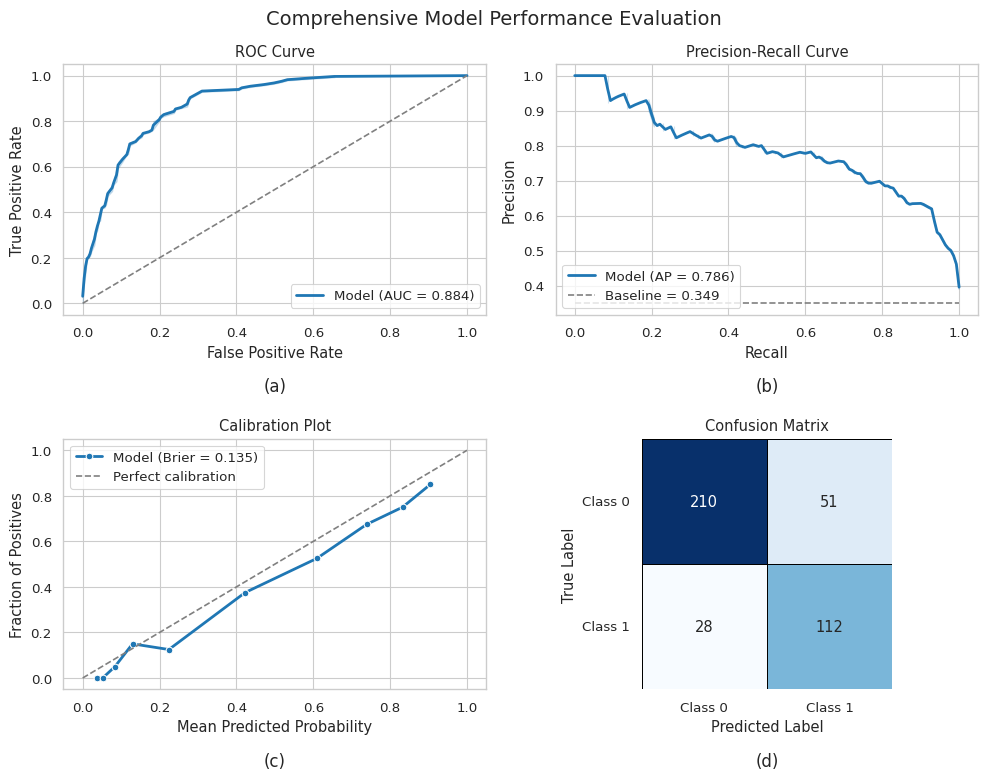

In [57]:
test_plot(y_test, y_score, y_pred)

In [58]:
y_score = get_binary_scores(final_model, X_test)
# y_pred = (y_score >= best_threshold).astype(int)
y_pred = final_model.predict(X_test)

# print("best params:", search.best_params_)
print("report:\n", classification_report(y_test, y_pred, digits=4))
print("CM:\n", confusion_matrix(y_test, y_pred))

if y_score is not None:
    print("Test PR-AUC:", average_precision_score(y_test, y_score))

# print("Threshold:", best_threshold)

report:
               precision    recall  f1-score   support

           0     0.8745    0.8276    0.8504       261
           1     0.7078    0.7786    0.7415       140

    accuracy                         0.8105       401
   macro avg     0.7911    0.8031    0.7959       401
weighted avg     0.8163    0.8105    0.8124       401

CM:
 [[216  45]
 [ 31 109]]
Test PR-AUC: 0.7908400372450408


In [63]:
best_threshold = 0.37

In [64]:
y_score = get_binary_scores(final_model, X_test)
y_pred = (y_score >= best_threshold).astype(int)
# y_pred = final_model.predict(X_test)

# print("best params:", search.best_params_)
print("report:\n", classification_report(y_test, y_pred, digits=4))
print("CM:\n", confusion_matrix(y_test, y_pred))

if y_score is not None:
    print("Test PR-AUC:", average_precision_score(y_test, y_score))

print("Threshold:", best_threshold)

report:
               precision    recall  f1-score   support

           0     0.9043    0.7969    0.8473       261
           1     0.6901    0.8429    0.7588       140

    accuracy                         0.8130       401
   macro avg     0.7972    0.8199    0.8030       401
weighted avg     0.8295    0.8130    0.8164       401

CM:
 [[208  53]
 [ 22 118]]
Test PR-AUC: 0.7908400372450408
Threshold: 0.37


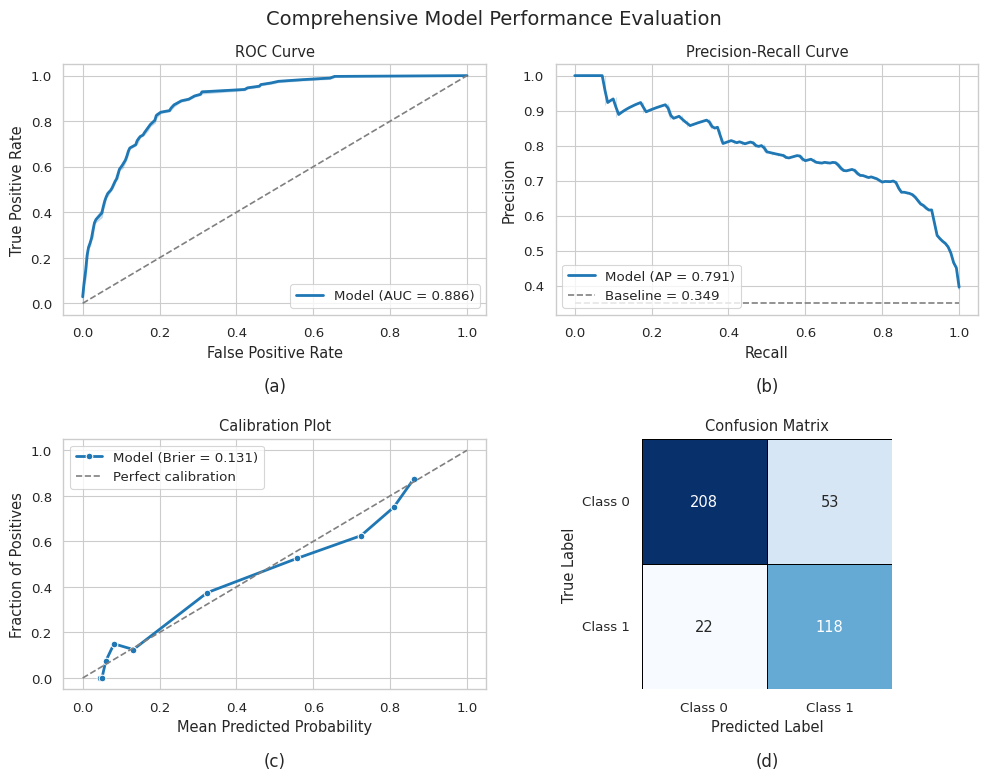

In [65]:
test_plot(y_test, y_score, y_pred)

In [66]:
point_metrics, ci_df, summary_df = evaluate_model_with_ci(
    y_test=y_test,
    y_pred=y_pred,
    y_score=y_score,
    n_bootstrap=2000,
    random_state=RANDOM_STATE
)

# Print compact table for paper
print("\nSummary Table")
print(summary_df[["metric", "formatted"]].to_string(index=False))


Confusion Matrix Counts
TN: 208, FP: 53, FN: 22, TP: 118

Class-wise Metrics
Precision (Class 0): 0.9043 (0.9048)(95% CI: 0.8659 - 0.9402)
Precision (Class 1): 0.6901 (0.6899)(95% CI: 0.6175 - 0.7544)
Recall (Class 0): 0.7969 (0.7962)(95% CI: 0.7453 - 0.8419)
Recall (Class 1): 0.8429 (0.8441)(95% CI: 0.7838 - 0.9000)
F1 Score (Class 0): 0.8473 (0.8468)(95% CI: 0.8121 - 0.8784)
F1 Score (Class 1): 0.7588 (0.7586)(95% CI: 0.7029 - 0.8079)

Macro Average Metrics
Precision (Macro): 0.7972 (0.7973)(95% CI: 0.7570 - 0.8342)
Recall (Macro): 0.8199 (0.8201)(95% CI: 0.7825 - 0.8577)
F1 Score (Macro): 0.8030 (0.8027)(95% CI: 0.7622 - 0.8402)

Positive-Class / Threshold Metrics
Precision: 0.6901 (0.6899)(95% CI: 0.6175 - 0.7544)
Recall: 0.8429 (0.8441)(95% CI: 0.7838 - 0.9000)
F1 Score: 0.7588 (0.7586)(95% CI: 0.7029 - 0.8079)
Positive Predictive Value (PPV): 0.6901 (0.6899)(95% CI: 0.6175 - 0.7544)
Negative Predictive Value (NPV): 0.9043 (0.9048)(95% CI: 0.8659 - 0.9402)
Balanced Accuracy: 0.81